# Ensemble model prediction on a single image and a folder of images

This notebook walks through loading several models each trained for the same task, making ensemble prediction with an image, and inspecting the outputs


by Daniel Buscombe, October 2022

## Contents

* Part 1: load libraries
* Part 2: select and load models
    * we use 3 models trained for the same task: finding diftwood in aerial images of a river
    * we repurpose a snippet of code from the Gym script `seg_images_in_folder.py` to load in and make each model and apply the model weights from h5 files
* Part 3: Application of each model on a sample image
    * load an example image
    * apply all 3 models to the image and inspect the outputs
    * visualize the variability in the outputs
* Part 4: Application of ensembled model on a sample image
    * apply all 3 models and aggregate softmax scores for an ensemble model prediction
    * demonstrate the use of Otsu (adaptive) thresholding versus normal thresholding
    * demonstrate the use of Conditional Random Field for model inference (no thresholding)
* Part 5: Putting it all together: Ensembled model with TTA and  Otsu thresholding
    * create functions for reading imagery and applying models with or without Otsu thresholding
    * apply the model to a folder of 20 images to examine variability in model outputs, and to visually determine the optimal inference strategy

## Part 1: load libraries

In [1]:
#load up the basics
import os, json
import numpy as np
import matplotlib
import pandas as pd
from tqdm import tqdm

## Part 2: select and load models

here i am using 3 models trained to segment aerial images to find driftwood

the models have been trained in slightly different ways but each accept an image and make a wood/no wood label image

they each segments an RGB image into 2 classes (wood, other)

In [2]:

#model paths
model1_path = r'G:\elwha_ortho_segmentation\seg_zoo_model_datasets\elwha_aerial\v4\weights\resunet\wood\ct_F_resunet_allclasses_768_wood_v4_subsetv7_fullmodel.h5'
model2_path = r'G:\elwha_ortho_segmentation\seg_zoo_model_datasets\elwha_aerial\v4\weights\resunet\wood\ct_F_resunet_allclasses_768_wood_v6_subsetv7_fullmodel.h5'
model3_path = r'G:\elwha_ortho_segmentation\seg_zoo_model_datasets\elwha_aerial\v4\weights\resunet\wood\ct_F_resunet_allclasses_768_wood_v7_subsetv7_fullmodel.h5'

# make a list of these models
W = [os.path.normpath(model1_path), 
     os.path.normpath(model2_path), 
     os.path.normpath(model3_path)]


Below is the same code snippet that loads models and config settings for each model as in the Gym script `seg_images_in_folder.py`

In [3]:
# For each set of weights in W load them in
M= []; C=[]; T = []
for counter,weights in enumerate(W):

    try:
        # "fullmodel" is for serving on zoo they are smaller and more portable between systems than traditional h5 files
        # gym makes a h5 file, then you use gym to make a "fullmodel" version then zoo can read "fullmodel" version
        configfile = weights.replace('_fullmodel.h5','.json').replace('weights', 'config')
        with open(configfile) as f:
            config = json.load(f)
    except:
        # Turn the .h5 file into a json so that the data can be loaded into dynamic variables        
        configfile = weights.replace('.h5','.json').replace('weights', 'config')
        with open(configfile) as f:
            config = json.load(f)
    # Dynamically creates all variables from config dict.
    # For example configs's {'TARGET_SIZE': [768, 768]} will be created as TARGET_SIZE=[768, 768]
    # This is how the program is able to use variables that have never been explicitly defined
    for k in config.keys():
        exec(k+'=config["'+k+'"]')


    if counter==0:
        #####################################
        #### hardware
        ####################################

        SET_GPU = str(SET_GPU)

        if SET_GPU != '-1':
            USE_GPU = True
            print('Using GPU')
        else:
            USE_GPU = False
            print('Using CPU')

        if len(SET_GPU.split(','))>1:
            USE_MULTI_GPU = True 
            print('Using multiple GPUs')
        else:
            USE_MULTI_GPU = False
            if USE_GPU:
                print('Using single GPU device')
            else:
                print('Using single CPU device')

        #suppress tensorflow warnings
        os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

        if USE_GPU == True:
            os.environ['CUDA_VISIBLE_DEVICES'] = SET_GPU

            from doodleverse_utils.prediction_imports import *
            from tensorflow.python.client import device_lib
            physical_devices = tf.config.experimental.list_physical_devices('GPU')
            print(physical_devices)

            if physical_devices:
                # Restrict TensorFlow to only use the first GPU
                try:
                    tf.config.experimental.set_visible_devices(physical_devices, 'GPU')
                except RuntimeError as e:
                    # Visible devices must be set at program startup
                    print(e)
        else:
            os.environ['CUDA_VISIBLE_DEVICES'] = '-1'

            from doodleverse_utils.prediction_imports import *
            from tensorflow.python.client import device_lib
            physical_devices = tf.config.experimental.list_physical_devices('GPU')
            print(physical_devices)

        ### mixed precision
        from tensorflow.keras import mixed_precision
        mixed_precision.set_global_policy('mixed_float16')
        # tf.debugging.set_log_device_placement(True)

        for i in physical_devices:
            tf.config.experimental.set_memory_growth(i, True)
        print(tf.config.get_visible_devices())

        if USE_MULTI_GPU:
            # Create a MirroredStrategy.
            strategy = tf.distribute.MirroredStrategy([p.name.split('/physical_device:')[-1] for p in physical_devices], cross_device_ops=tf.distribute.HierarchicalCopyAllReduce())
            print("Number of distributed devices: {}".format(strategy.num_replicas_in_sync))


    #from imports import *
    from doodleverse_utils.imports import *
    from doodleverse_utils.model_imports import *

    #---------------------------------------------------

    #=======================================================
    # Import the architectures for following models from doodleverse_utils
    # 1. custom_resunet
    # 2. custom_unet
    # 3. simple_resunet
    # 4. simple_unet
    # 5. satunet
    # 6. custom_resunet
    # 7. custom_satunet

    # Get the selected model based on the weights file's MODEL key provided
    # create the model with the data loaded in from the weights file
    print('.....................................')
    print('Creating and compiling model {}...'.format(counter))

    if MODEL =='resunet':
        model =  custom_resunet((TARGET_SIZE[0], TARGET_SIZE[1], N_DATA_BANDS),
                        FILTERS,
                        nclasses=NCLASSES, 
                        kernel_size=(KERNEL,KERNEL),
                        strides=STRIDE,
                        dropout=DROPOUT,
                        dropout_change_per_layer=DROPOUT_CHANGE_PER_LAYER,
                        dropout_type=DROPOUT_TYPE,
                        use_dropout_on_upsampling=USE_DROPOUT_ON_UPSAMPLING,
                        )
    elif MODEL=='unet':
        model =  custom_unet((TARGET_SIZE[0], TARGET_SIZE[1], N_DATA_BANDS),
                        FILTERS,
                        nclasses=NCLASSES, 
                        kernel_size=(KERNEL,KERNEL),
                        strides=STRIDE,
                        dropout=DROPOUT,
                        dropout_change_per_layer=DROPOUT_CHANGE_PER_LAYER,
                        dropout_type=DROPOUT_TYPE,
                        use_dropout_on_upsampling=USE_DROPOUT_ON_UPSAMPLING,
                        )

    elif MODEL =='simple_resunet':

        model = simple_resunet((TARGET_SIZE[0], TARGET_SIZE[1], N_DATA_BANDS),
                    kernel = (2, 2),
                    num_classes=NCLASSES, 
                    activation="relu",
                    use_batch_norm=True,
                    dropout=DROPOUT,
                    dropout_change_per_layer=DROPOUT_CHANGE_PER_LAYER,
                    dropout_type=DROPOUT_TYPE,
                    use_dropout_on_upsampling=USE_DROPOUT_ON_UPSAMPLING,
                    filters=FILTERS,
                    num_layers=4,
                    strides=(1,1))

    elif MODEL=='simple_unet':
        model = simple_unet((TARGET_SIZE[0], TARGET_SIZE[1], N_DATA_BANDS),
                    kernel = (2, 2),
                    num_classes=NCLASSES, 
                    activation="relu",
                    use_batch_norm=True,
                    dropout=DROPOUT,
                    dropout_change_per_layer=DROPOUT_CHANGE_PER_LAYER,
                    dropout_type=DROPOUT_TYPE,
                    use_dropout_on_upsampling=USE_DROPOUT_ON_UPSAMPLING,
                    filters=FILTERS,
                    num_layers=4,
                    strides=(1,1))

    elif MODEL=='satunet':

        model = custom_satunet((TARGET_SIZE[0], TARGET_SIZE[1], N_DATA_BANDS),
                    kernel = (2, 2),
                    num_classes=NCLASSES, #[NCLASSES+1 if NCLASSES==1 else NCLASSES][0],
                    activation="relu",
                    use_batch_norm=True,
                    dropout=DROPOUT,
                    dropout_change_per_layer=DROPOUT_CHANGE_PER_LAYER,
                    dropout_type=DROPOUT_TYPE,
                    use_dropout_on_upsampling=USE_DROPOUT_ON_UPSAMPLING,
                    filters=FILTERS,
                    num_layers=4,
                    strides=(1,1))

    else:
        print("Model must be one of 'unet', 'resunet', or 'satunet'")
        sys.exit(2)

    try:
        # Load in the model from the weights which is the location of the weights file        
        model = tf.keras.models.load_model(weights)

        M.append(model)
        C.append(configfile)
        T.append(MODEL)
        
    except:
        # Load the metrics mean_iou, dice_coef from doodleverse_utils
        # Load in the custom loss function from doodleverse_utils        
        model.compile(optimizer = 'adam', loss = dice_coef_loss(NCLASSES))#, metrics = [iou_multi(NCLASSES), dice_multi(NCLASSES)])

        model.load_weights(weights)

        M.append(model)
        C.append(configfile)
        T.append(MODEL)

Using GPU
Using single GPU device
Version:  2.6.0
Eager mode:  True
Version:  2.6.0
Eager mode:  True
GPU name:  [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Num GPUs Available:  1
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: NVIDIA GeForce RTX 3090, compute capability 8.6
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
.....................................
Creating and compiling model 0...
.....................................
Creating and compiling model 1...
.....................................
Creating and compiling model 2...


Now we have 3 model instances

In [4]:
M

... 3 config files

In [5]:
C

['G:\\elwha_ortho_segmentation\\seg_zoo_model_datasets\\elwha_aerial\\v4\\config\\resunet\\wood\\ct_F_resunet_allclasses_768_wood_v4_subsetv7.json',
 'G:\\elwha_ortho_segmentation\\seg_zoo_model_datasets\\elwha_aerial\\v4\\config\\resunet\\wood\\ct_F_resunet_allclasses_768_wood_v6_subsetv7.json',
 'G:\\elwha_ortho_segmentation\\seg_zoo_model_datasets\\elwha_aerial\\v4\\config\\resunet\\wood\\ct_F_resunet_allclasses_768_wood_v7_subsetv7.json']

... and 3 model types

In [6]:
T

['resunet', 'resunet', 'resunet']

Next, we will load an image, and apply the models

## Part 3: Application of each model on a sample image

Doodleverse-utils uses an "Agg" backend for matplotlib that suppresses outputs, so we'll use the "nbAgg" backend for the purposes of this demo

In [7]:
matplotlib.use("nbAgg")
import matplotlib.pyplot as plt

<IPython.core.display.Javascript object>


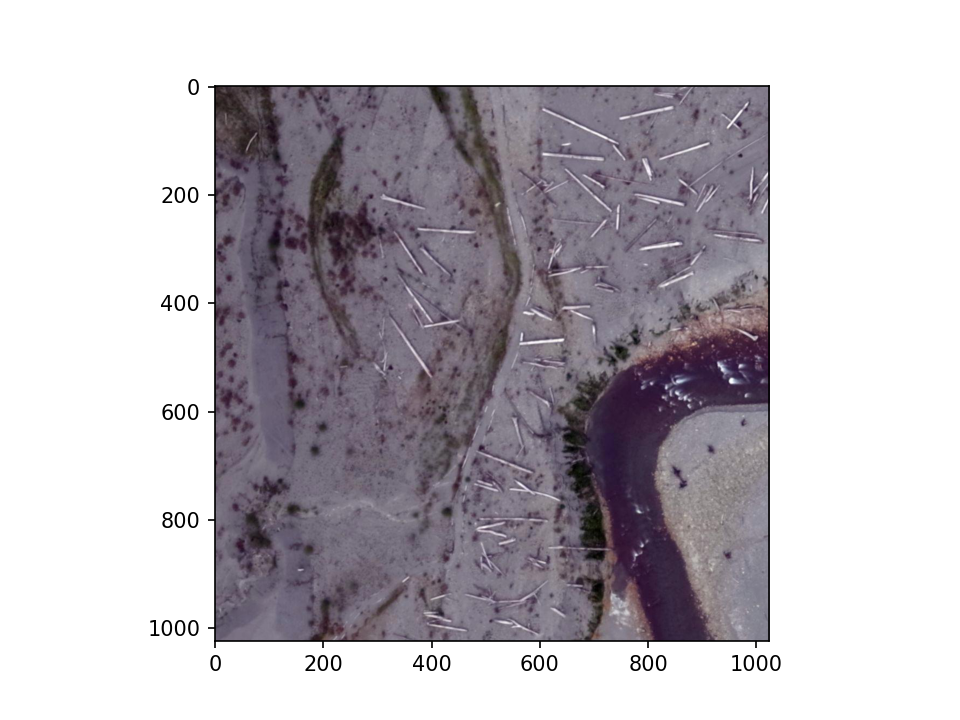

In [8]:
#load up an image and display it
ImPath = r"G:\elwha_ortho_segmentation\seg_zoo_model_datasets\elwha_aerial\v4\images\Elwha_20150923_RGBAvg_NAD83GCS_123_005_JJF.jpg"
img = matplotlib.image.imread(ImPath)
imgplot=plt.imshow(img)
plt.show()

Resize the image to TARGET_SIZE, which is the dimensions of the image that the model was trained on

<IPython.core.display.Javascript object>


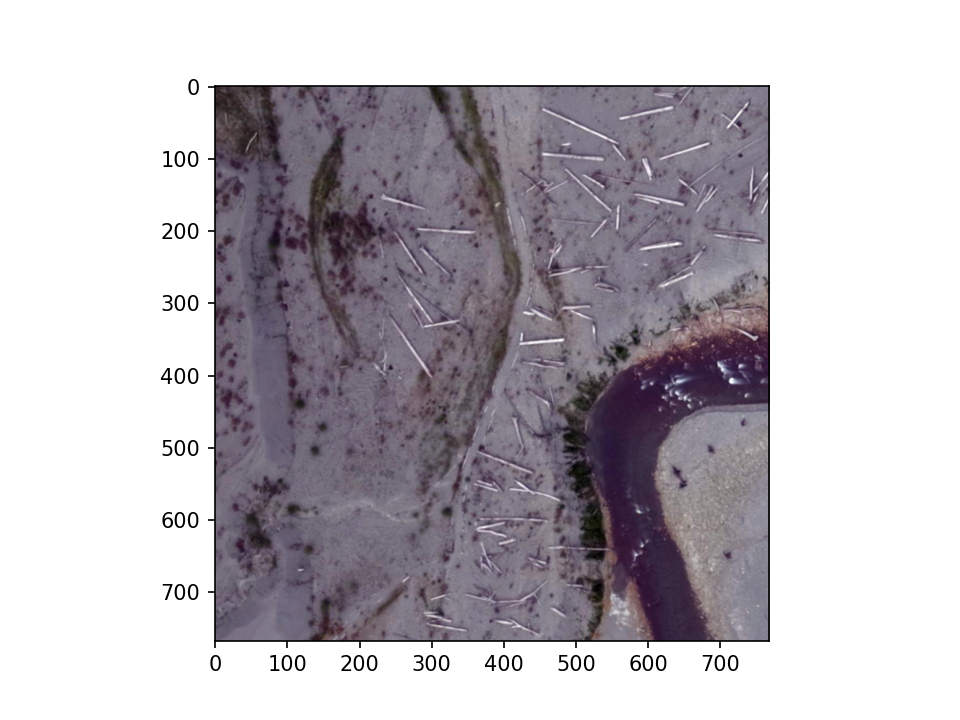

In [9]:
smallimage = resize(
    img, (TARGET_SIZE[0], TARGET_SIZE[1]), preserve_range=True, clip=True
)
smallimage = np.array(smallimage)

w = tf.shape(img)[0]
h = tf.shape(img)[1]

imgplot=plt.imshow(smallimage/255.)
plt.show()

Standardize the image. Gym models are always trained using standardized imagery, so our model expects standardized imagery as inputs

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<IPython.core.display.Javascript object>


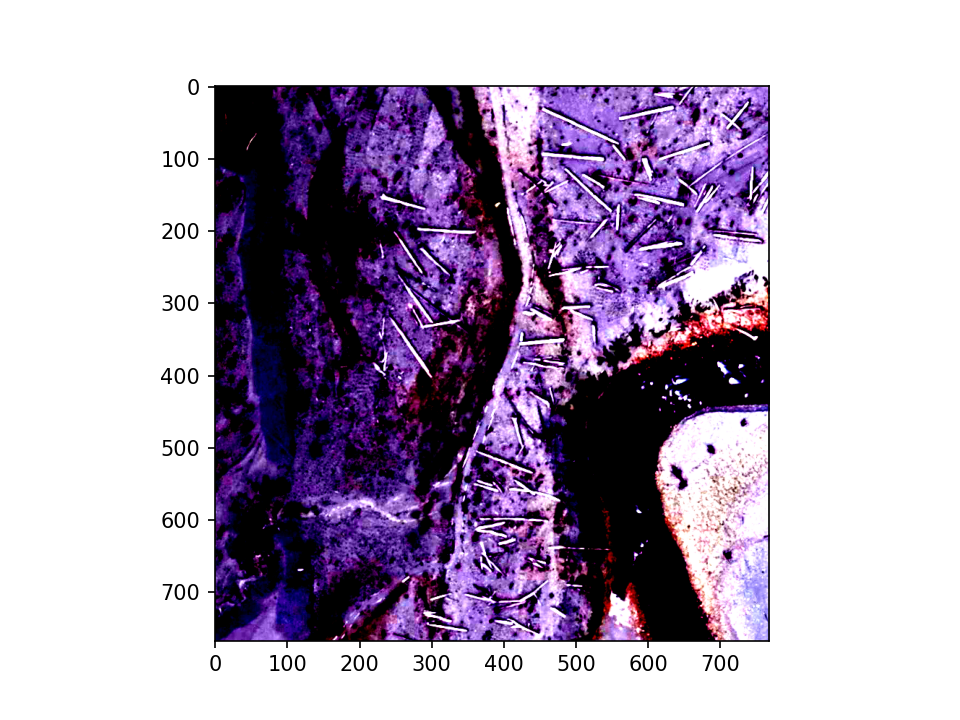

In [34]:
simg = standardize(smallimage.astype('uint8')).squeeze()

imgplot=plt.imshow(simg)
plt.show()

Cycle through each model and make predictions

In [11]:
E = []

for counter, model in enumerate(M):
    print("Using model {}".format(counter))
    est_label = model.predict(tf.expand_dims(simg, 0), batch_size=1).squeeze()

    E.append(est_label[:,:,1])
    del est_label

Using model 0
Using model 1
Using model 2


Let's take a look at the 3 raw model outputs (softmax scores)

<IPython.core.display.Javascript object>


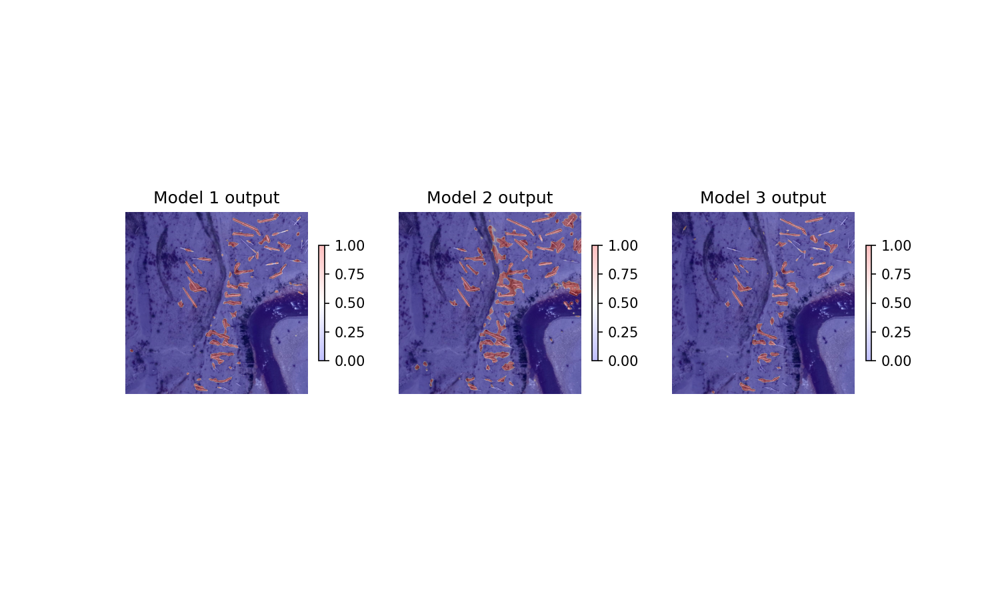

In [12]:
plt.figure(figsize=(10,6))
plt.subplot(131)
plt.imshow(smallimage/255.)
plt.imshow(E[0], vmin=0, vmax=1, cmap='bwr', alpha=0.25)
plt.axis('off')
plt.colorbar(shrink=0.25)
plt.title('Model 1 output')

plt.subplot(132)
plt.imshow(smallimage/255.)
plt.imshow(E[1], vmin=0, vmax=1, cmap='bwr', alpha=0.25)
plt.axis('off')
plt.colorbar(shrink=0.25)
plt.title('Model 2 output')

plt.subplot(133)
plt.imshow(smallimage/255.)
plt.imshow(E[2], vmin=0, vmax=1, cmap='bwr', alpha=0.25)
plt.axis('off')
plt.colorbar(shrink=0.25)
plt.title('Model 3 output')
plt.show()

Next, let's look to see if the distributions of softmax scores differ much between models

<IPython.core.display.Javascript object>


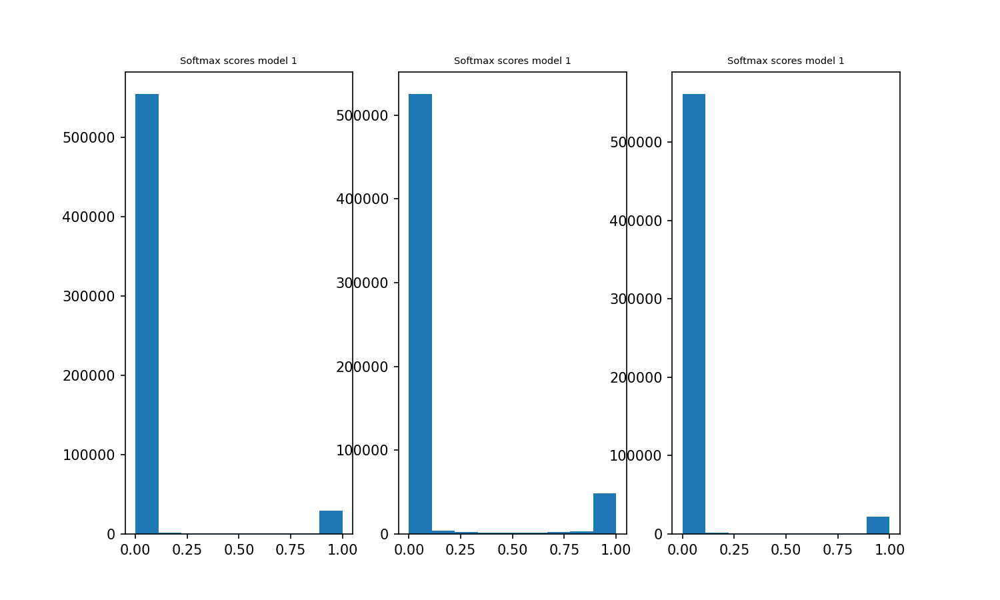

In [13]:
plt.figure(figsize=(10,6))
plt.subplot(131)
plt.hist(E[0].flatten(), bins=np.linspace(0,1,10))
plt.title('Softmax scores model 1', fontsize=7)

plt.subplot(132)
plt.hist(E[1].flatten(), bins=np.linspace(0,1,10))
plt.title('Softmax scores model 1', fontsize=7)

plt.subplot(133)
plt.hist(E[2].flatten(), bins=np.linspace(0,1,10))
plt.title('Softmax scores model 1', fontsize=7)

plt.show()

## Part 4: Application of ensembled model on a sample image

### Option: test-time augmentation

Test-time augmentation is the practice of transforming imagery for model predictions. Those transformed images create transformed outputs, which are then un-transformed. It is a way to augment imagery at test-time. It is an oversampling technique that usually, but not always, helps build in robustness to model predictions

In [14]:
E0 = []
E1 = []

num_TTA = 4

for counter, model in enumerate(M):

    est_label1 = model.predict(tf.expand_dims(simg, 0), batch_size=1).squeeze()

    # return the flipped prediction
    est_label2 = np.flipud(
        model.predict(
            tf.expand_dims(np.flipud(simg), 0), batch_size=1
        ).squeeze()
    )
    est_label3 = np.fliplr(
        model.predict(
            tf.expand_dims(np.fliplr(simg), 0), batch_size=1
        ).squeeze()
    )
    est_label4 = np.flipud(
        np.fliplr(
            model.predict(
                tf.expand_dims(np.flipud(np.fliplr(simg)), 0), batch_size=1
            ).squeeze()
        )
    )

    # soft voting - sum the softmax scores to return the new TTA estimated softmax scores
    est_label = (est_label1 + est_label2 + est_label3 + est_label4)/num_TTA

    # resize outputs to full size
    E0.append(
        resize(est_label[:, :, 0], (w, h), preserve_range=True, clip=True)
    )
    E1.append(
        resize(est_label[:, :, 1], (w, h), preserve_range=True, clip=True)
    )


Let's look at the 4 test-time augmentation outputs from the last model (model 3)

<IPython.core.display.Javascript object>


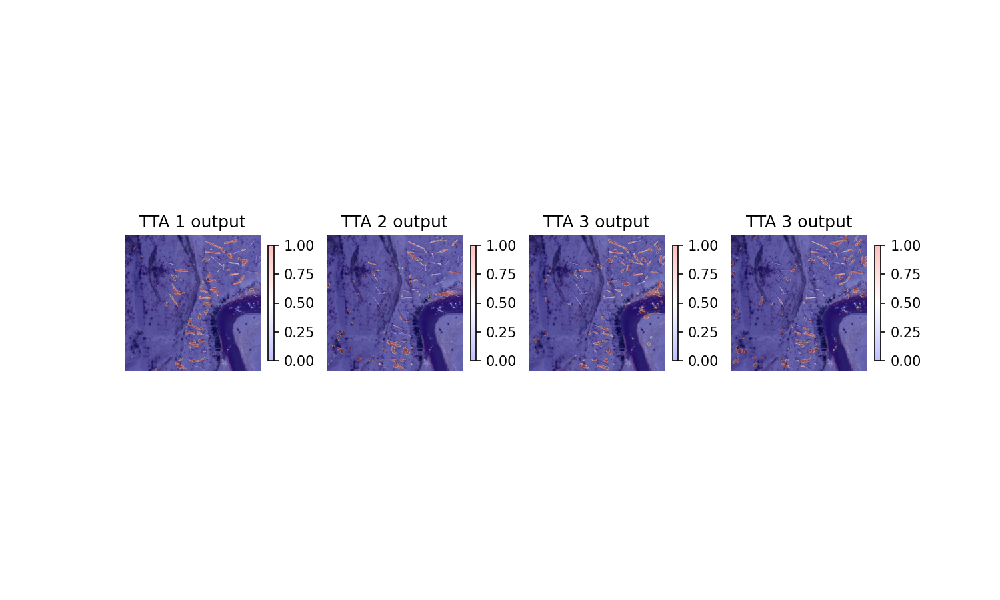

In [15]:
plt.figure(figsize=(10,6))
plt.subplot(141)
plt.imshow(smallimage/255.)
plt.imshow(est_label1[:,:,1], vmin=0, vmax=1, cmap='bwr', alpha=0.25)
plt.axis('off')
plt.colorbar(shrink=0.25)
plt.title('TTA 1 output')

plt.subplot(142)
plt.imshow(smallimage/255.)
plt.imshow(est_label2[:,:,1], vmin=0, vmax=1, cmap='bwr', alpha=0.25)
plt.axis('off')
plt.colorbar(shrink=0.25)
plt.title('TTA 2 output')

plt.subplot(143)
plt.imshow(smallimage/255.)
plt.imshow(est_label3[:,:,1], vmin=0, vmax=1, cmap='bwr', alpha=0.25)
plt.axis('off')
plt.colorbar(shrink=0.25)
plt.title('TTA 3 output')

plt.subplot(144)
plt.imshow(smallimage/255.)
plt.imshow(est_label4[:,:,1], vmin=0, vmax=1, cmap='bwr', alpha=0.25)
plt.axis('off')
plt.colorbar(shrink=0.25)
plt.title('TTA 4 output')
plt.show()

Next, we'll take a look at aggregated softmax scores across all TTAs, and then binary outputs based on a threshold of 0.5 (standard), and a lower decision threshold of 0.25 (liberal)

<IPython.core.display.Javascript object>


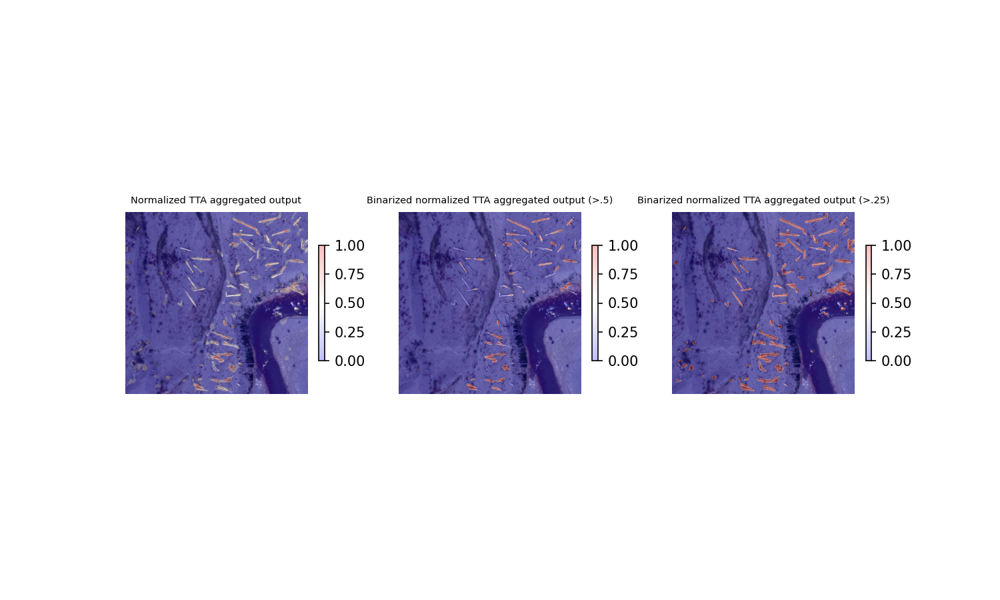

In [16]:
plt.figure(figsize=(10,6))
plt.subplot(131)
plt.imshow(smallimage/255.)
plt.imshow(est_label[:,:,1], vmin=0, vmax=1, cmap='bwr', alpha=0.25)
plt.axis('off')
plt.colorbar(shrink=0.25)
plt.title('Normalized TTA aggregated output', fontsize=7)

plt.subplot(132)
plt.imshow(smallimage/255.)
plt.imshow(est_label[:,:,1]>.5, vmin=0, vmax=1, cmap='bwr', alpha=0.25)
plt.axis('off')
plt.colorbar(shrink=0.25)
plt.title('Binarized normalized TTA aggregated output (>.5)', fontsize=7)

plt.subplot(133)
plt.imshow(smallimage/255.)
plt.imshow(est_label[:,:,1]>.25, vmin=0, vmax=1, cmap='bwr', alpha=0.25)
plt.axis('off')
plt.colorbar(shrink=0.25)
plt.title('Binarized normalized TTA aggregated output (>.25)', fontsize=7)
plt.show()

Here we look at the variability in softmax scores across 3 models

<IPython.core.display.Javascript object>


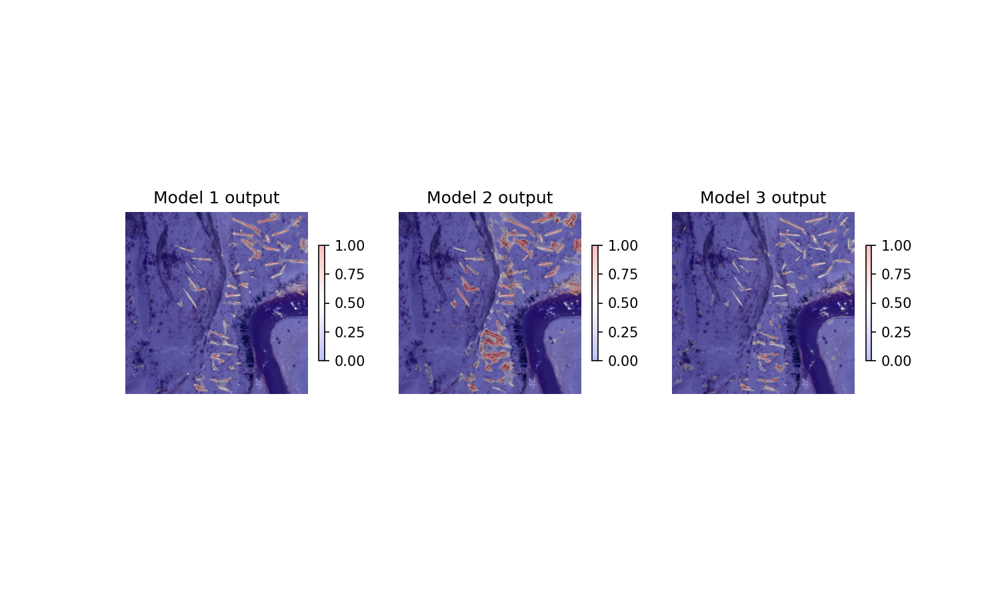

In [17]:
plt.figure(figsize=(10,6))
plt.subplot(131)
plt.imshow(img/255.)
plt.imshow(E1[0], vmin=0, vmax=1, cmap='bwr', alpha=0.25)
plt.axis('off')
plt.colorbar(shrink=0.25)
plt.title('Model 1 output')

plt.subplot(132)
plt.imshow(img/255.)
plt.imshow(E1[1], vmin=0, vmax=1, cmap='bwr', alpha=0.25)
plt.axis('off')
plt.colorbar(shrink=0.25)
plt.title('Model 2 output')

plt.subplot(133)
plt.imshow(img/255.)
plt.imshow(E1[2], vmin=0, vmax=1, cmap='bwr', alpha=0.25)
plt.axis('off')
plt.colorbar(shrink=0.25)
plt.title('Model 3 output')
plt.show()

average the softmax scores across 3 models

In [18]:
e1 = np.average(np.dstack(E1), axis=-1)

Create model weights ( in our example, 1 = first model, 0.5 = second model,  0.5 = third model), then apply a weighted average

In [19]:
W=[1,.5,.5]
e1w = np.average(np.dstack(E1), axis=-1 , weights=np.array(W))

Plot the difference between unweighted (left) and weighted (right) outputs

<IPython.core.display.Javascript object>


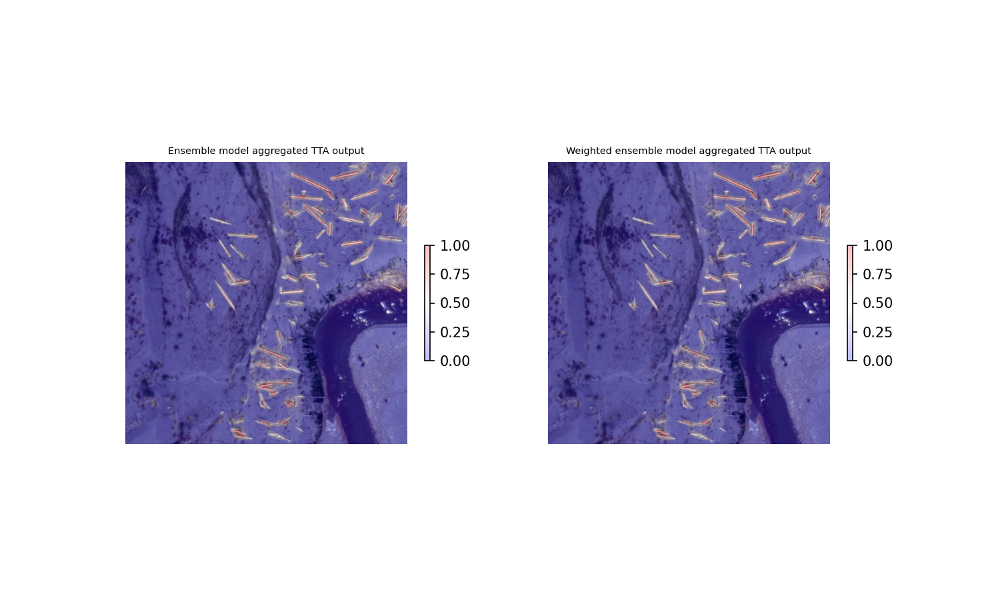

In [20]:
plt.figure(figsize=(10,6))

plt.subplot(121)
plt.imshow(img/255.)
plt.imshow(e1, vmin=0, vmax=1, cmap='bwr', alpha=0.25)
plt.axis('off')
plt.colorbar(shrink=0.25)
plt.title('Ensemble model aggregated TTA output', fontsize=7)

plt.subplot(122)
plt.imshow(img/255.)
plt.imshow(e1w, vmin=0, vmax=1, cmap='bwr', alpha=0.25)
plt.axis('off')
plt.colorbar(shrink=0.25)
plt.title('Weighted ensemble model aggregated TTA output', fontsize=7)
plt.show()

### Option: Otsu thresholding

Adaptive thresholding could be ised instead of a static threshold. This determines the optimal threshold on an image-by-image basis. Otsu's method is a popular one

First, let's look at the distribution of softmax scores

<IPython.core.display.Javascript object>


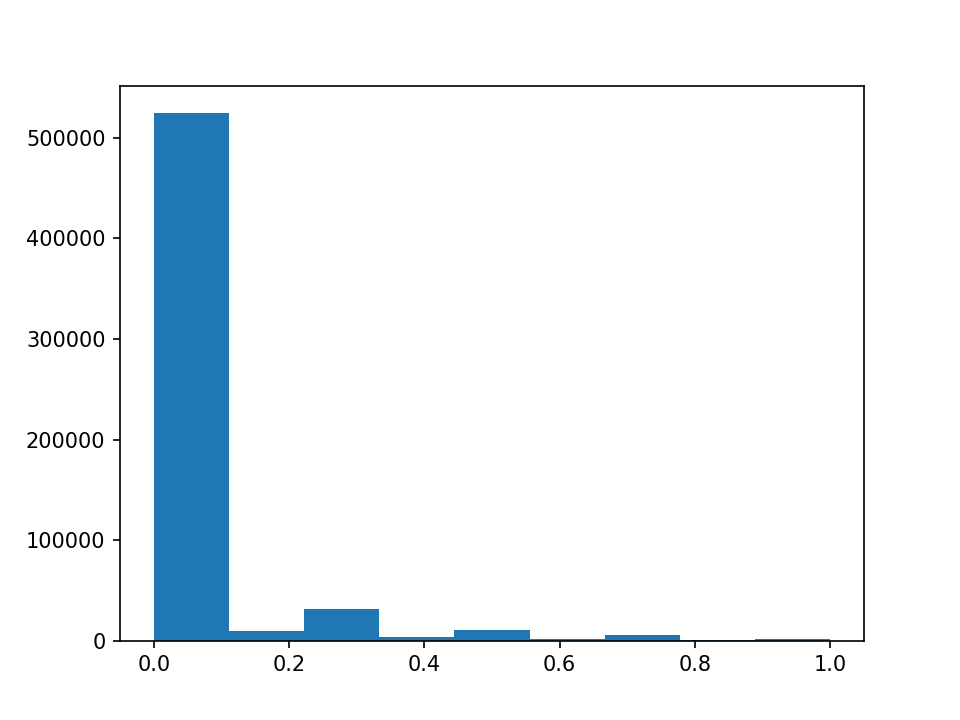

In [21]:
plt.hist(est_label[:,:,1].flatten(), bins=np.linspace(0,1,10))
plt.show()

Next, compute the Otsu threshold based on 10 bins, and finally, plot the difference in outcomes using normal 0.5 and a Otsu threshold

In [22]:
thres = threshold_otsu(est_label, nbins=10)
print(thres)

0.45


<IPython.core.display.Javascript object>


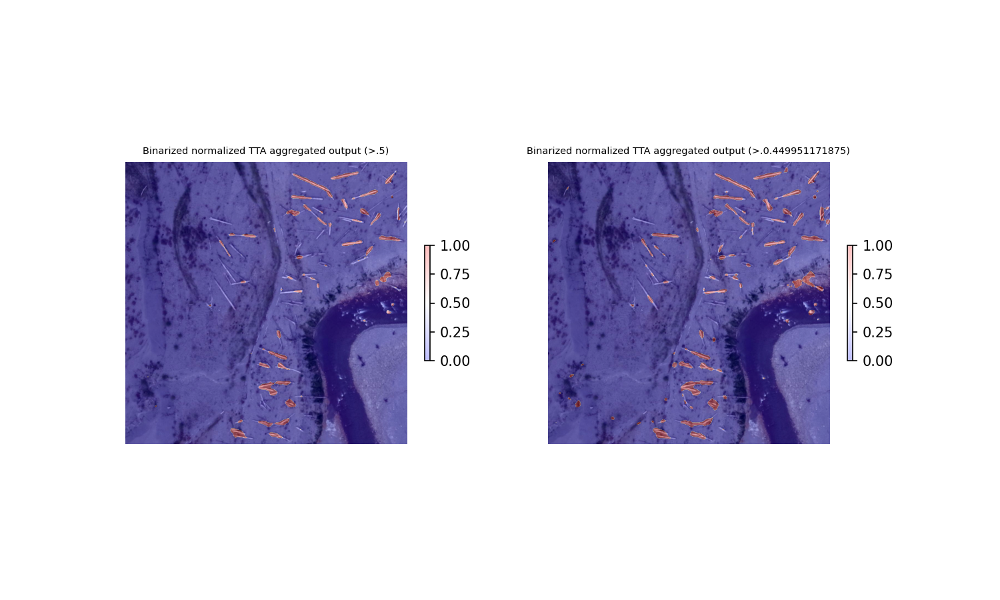

In [23]:
plt.figure(figsize=(10,6))

plt.subplot(121)
plt.imshow(smallimage/255.)
plt.imshow(est_label[:,:,1]>.5, vmin=0, vmax=1, cmap='bwr', alpha=0.25)
plt.axis('off')
plt.colorbar(shrink=0.25)
plt.title('Binarized normalized TTA aggregated output (>.5)', fontsize=7)

plt.subplot(122)
plt.imshow(smallimage/255.)
plt.imshow(est_label[:,:,1]>thres, vmin=0, vmax=1, cmap='bwr', alpha=0.25)
plt.axis('off')
plt.colorbar(shrink=0.25)
plt.title('Binarized normalized TTA aggregated output (>.{})'.format(thres), fontsize=7)
plt.show()

### Option: CRF post-processing

As an alternative to normal and Otsu thresholding, Gym provides an option to carry out label creation using a Conditional Random Field

First, stack the softmax scores. The CRF will expect 1 band of softmax scores per class. For binary problems, the two classes are complements (softmax scores should sum to 1 per pixel across all classes)

In [24]:
softmax_scores = np.dstack((e1,1-e1))

Set some parameters for the CRF

In [25]:
crf_theta=10
crf_mu=10
crf_downsample_factor=1 #1= no downsampling

Carry out the inference, then make the outputs a binary mask with wood pixels coded as 1

In [26]:
CRF_est_label, l_unique = crf_refine(
    softmax_scores, img, NCLASSES, 
    crf_theta, crf_mu, crf_downsample_factor)

# substract 1
CRF_est_label -= 1

#reverse
CRF_est_label = 1- CRF_est_label

make a plot

<IPython.core.display.Javascript object>


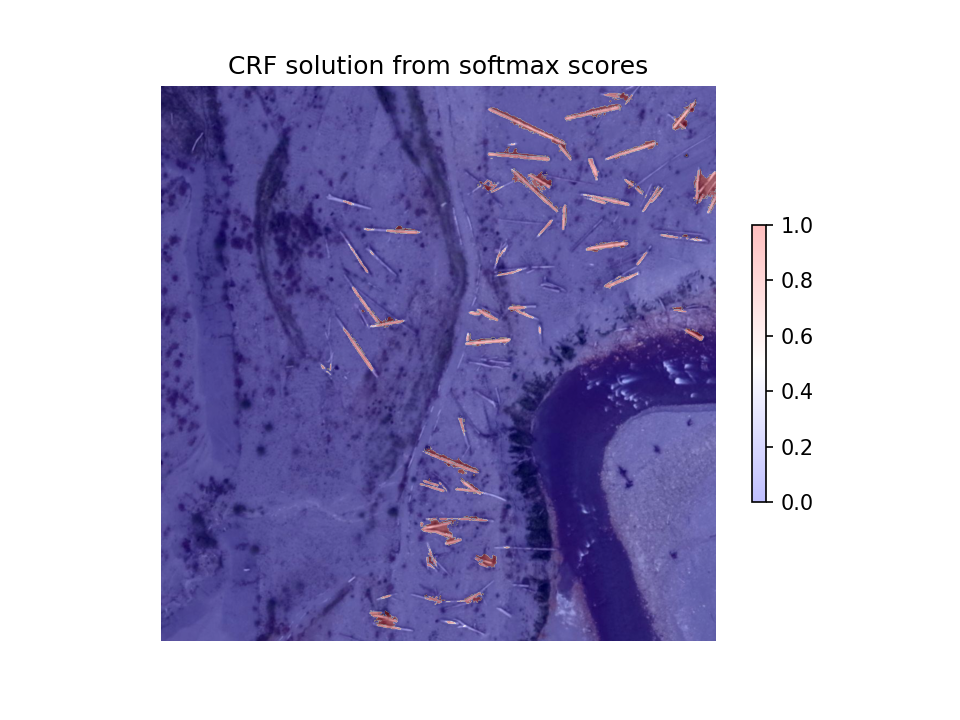

In [27]:
plt.imshow(img/255.)
plt.imshow(CRF_est_label,  cmap='bwr', alpha=0.25)
plt.axis('off')
plt.colorbar(shrink=0.5)
plt.title('CRF solution from softmax scores')
plt.show()

## Part 5: Putting it all together: Ensembled model with TTA and  Otsu thresholding

This function will carry out TTA, then optionally use Otsu thresholding (otherwise, normal decision threshold of 0.5 is used)

In [28]:
def do_seg_driftwood(simg, w, h, M, USE_OTSU=False):

    E = []

    num_TTA = 4

    for counter, model in enumerate(M):

        est_label1 = model.predict(tf.expand_dims(simg, 0), batch_size=1).squeeze()

        # return the flipped prediction
        est_label2 = np.flipud(
            model.predict(
                tf.expand_dims(np.flipud(simg), 0), batch_size=1
            ).squeeze()
        )
        est_label3 = np.fliplr(
            model.predict(
                tf.expand_dims(np.fliplr(simg), 0), batch_size=1
            ).squeeze()
        )
        est_label4 = np.flipud(
            np.fliplr(
                model.predict(
                    tf.expand_dims(np.flipud(np.fliplr(simg)), 0), batch_size=1
                ).squeeze()
            )
        )

        # soft voting - sum the softmax scores to return the new TTA estimated softmax scores
        est_label = (est_label1 + est_label2 + est_label3 + est_label4)/num_TTA

        E.append(
            resize(est_label[:,:,1], (w, h), preserve_range=True, clip=True)
        )

    e = np.average(np.dstack(E), axis=-1)

    if USE_OTSU:
        thres = threshold_otsu(e, nbins=10)
        #print("Otsu threshold = {}".format(thres))
    else:
        if np.any(e>0.5):
            thres=0.5
        else:
            print('Warning, no wood found using threshold of 0.5 - reverting to Otsu')
            thres = threshold_otsu(e, nbins=10)

    return e>thres, thres



Test on the example image, and make a plot of the result

<IPython.core.display.Javascript object>


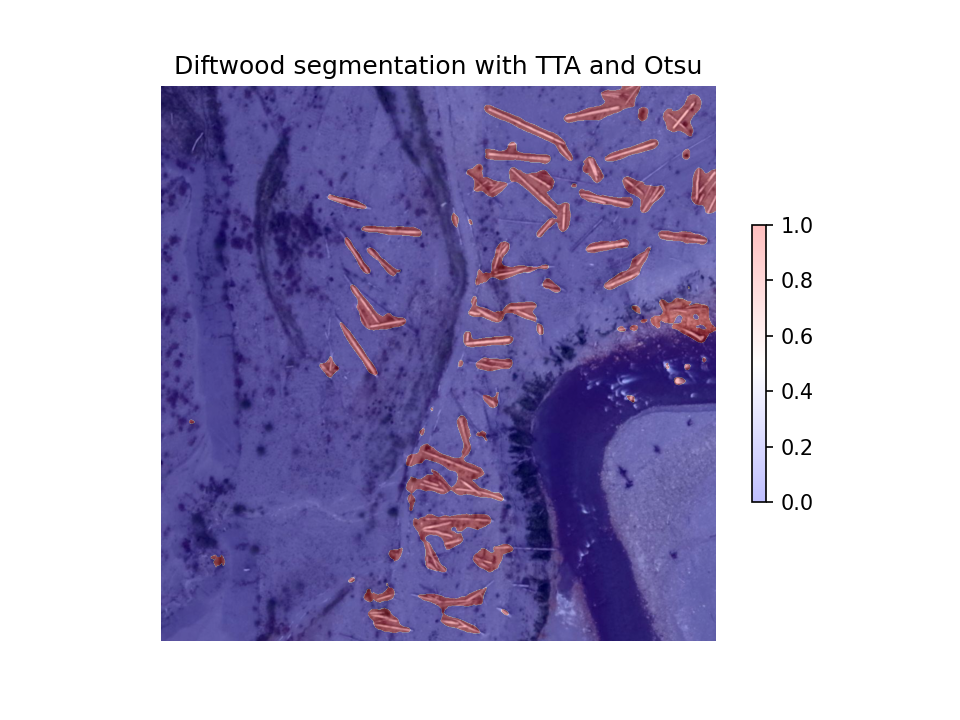

In [29]:

result, thres = do_seg_driftwood(simg, w, h, M, USE_OTSU=True)


plt.imshow(img/255.)
plt.imshow(result,  cmap='bwr', alpha=0.25)
plt.axis('off')
plt.colorbar(shrink=0.5)
plt.title('Diftwood segmentation with TTA and Otsu')
plt.show()

### Apply to a folder of images


Read in all example image file names

In [30]:
files = glob(r'G:\elwha_ortho_segmentation\seg_zoo_model_datasets\elwha_aerial\v4\images\wood_examples\*.jpg')
print(len(files))

20


Next, we'll need a function to read, resize, and standardize the imagery

In [31]:
def read_n_resize_image(file, TARGET_SIZE):

    img = matplotlib.image.imread(file)

    smallimage = resize(
        img, (TARGET_SIZE[0], TARGET_SIZE[1]), preserve_range=True, clip=True
    )
    smallimage = np.array(smallimage)

    w = tf.shape(img)[0]
    h = tf.shape(img)[1]

    simg = standardize(smallimage.astype('uint8')).squeeze()
    
    return img, simg, w, h


Run on the files

collect the input imagerry (O), results with normal threshold (R), and results with Otsu threshold (RO) for plotting later

In [32]:
R = []; RO= []
I = []
for file in tqdm(files):
    img, simg, w, h = read_n_resize_image(file, TARGET_SIZE)
    result, thres = do_seg_driftwood(simg, w, h, M, USE_OTSU=False)
    R.append(result)
    result, thres = do_seg_driftwood(simg, w, h, M, USE_OTSU=True)
    RO.append(result)    
    I.append(img)


 30%|██████████████████████▊                                                     | 6/20 [00:19<00:45,  3.25s/it]

Warning, no wood found using threshold of 0.5 - reverting to Otsu


100%|███████████████████████████████████████████████████████████████████████████| 20/20 [01:03<00:00,  3.17s/it]


Plot results side by side, without (left) and with (right) Otsu thresholding

<IPython.core.display.Javascript object>


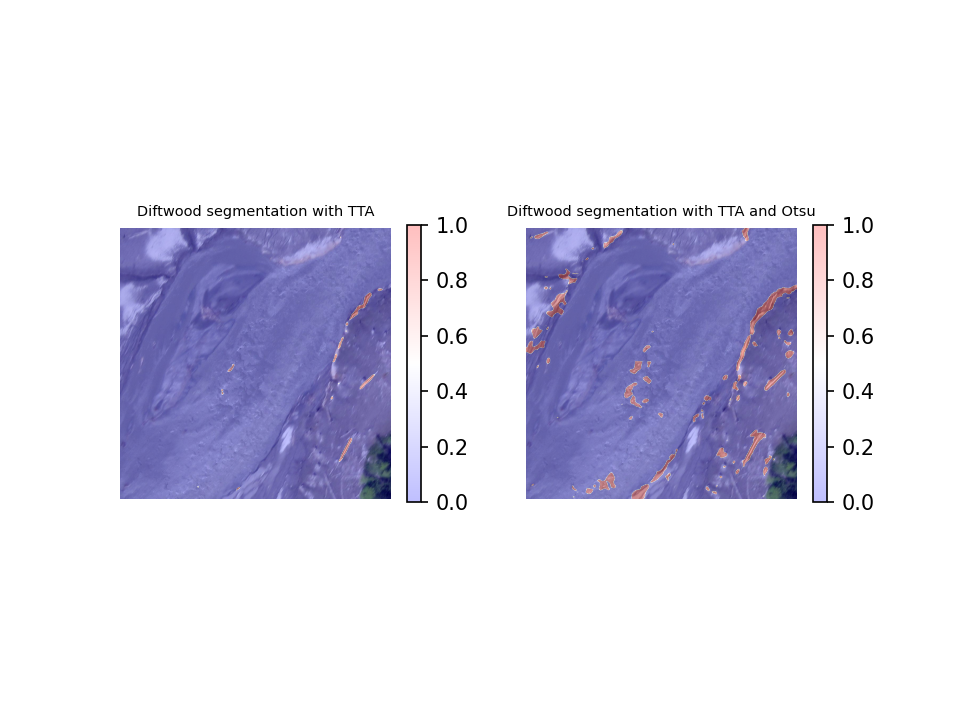

<IPython.core.display.Javascript object>


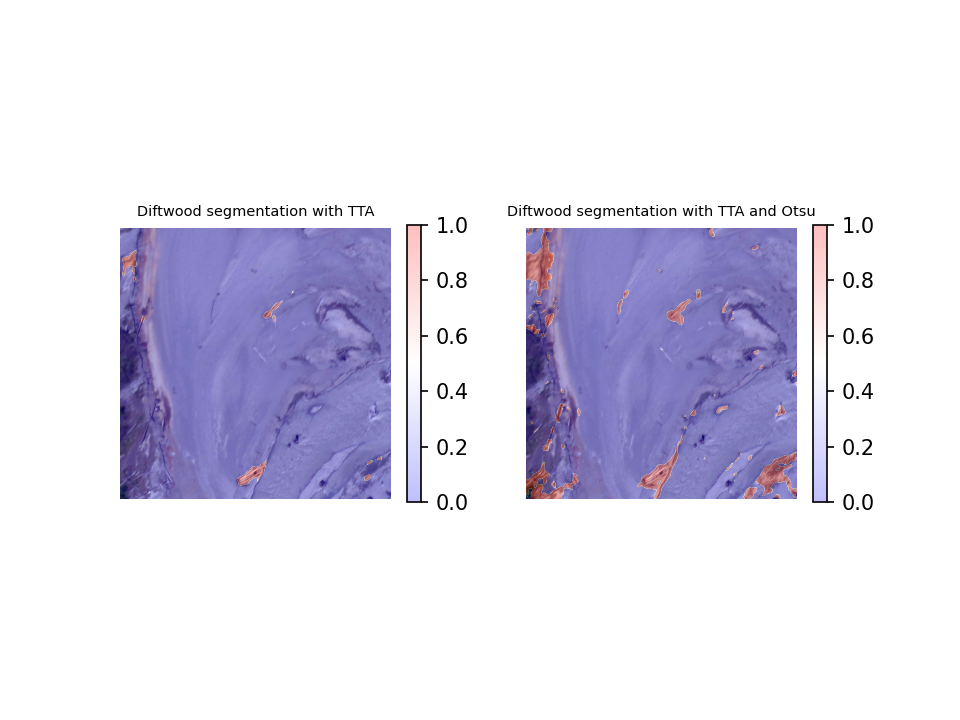

<IPython.core.display.Javascript object>


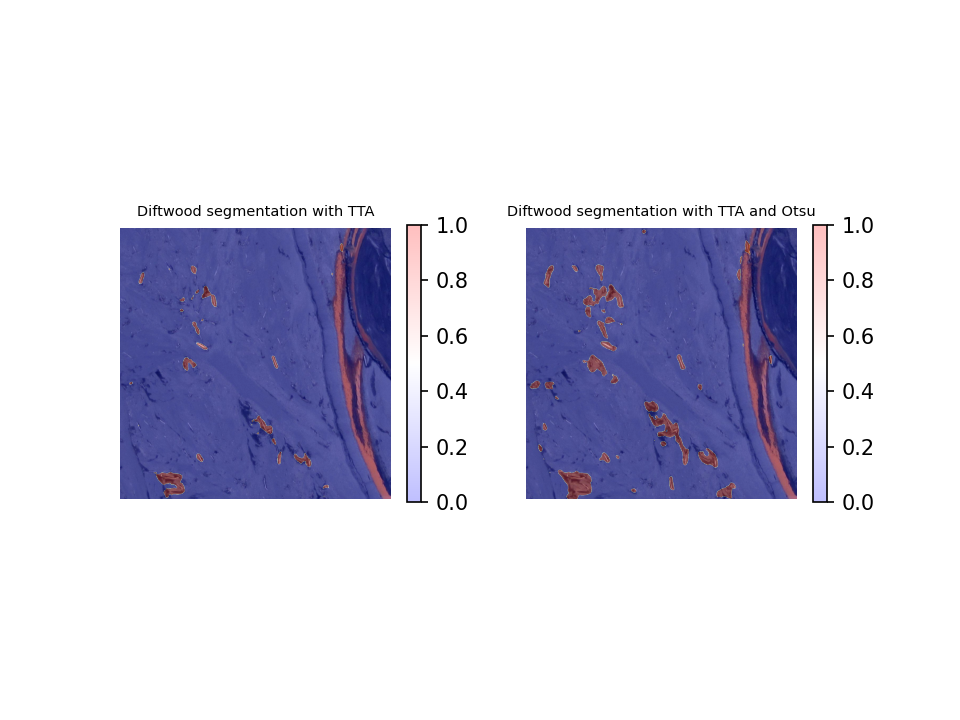

<IPython.core.display.Javascript object>


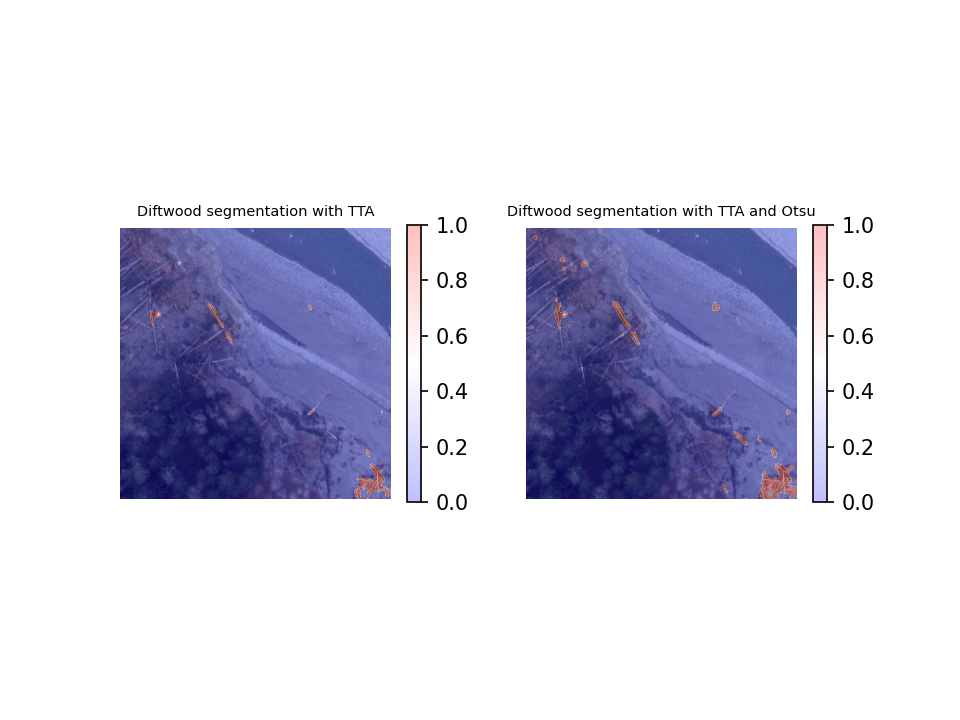

<IPython.core.display.Javascript object>


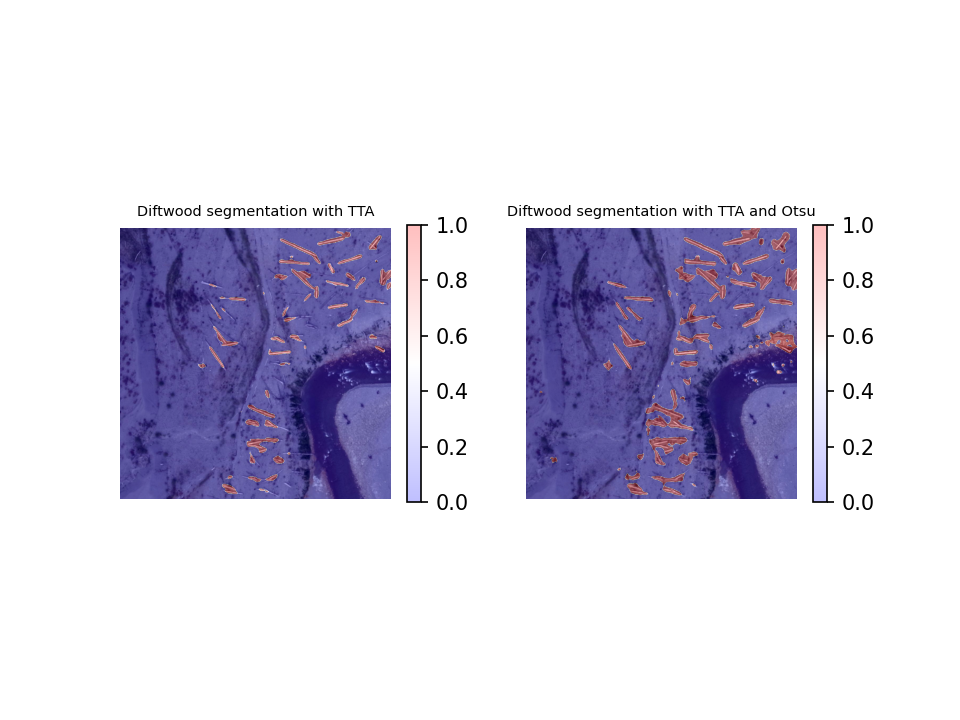

<IPython.core.display.Javascript object>


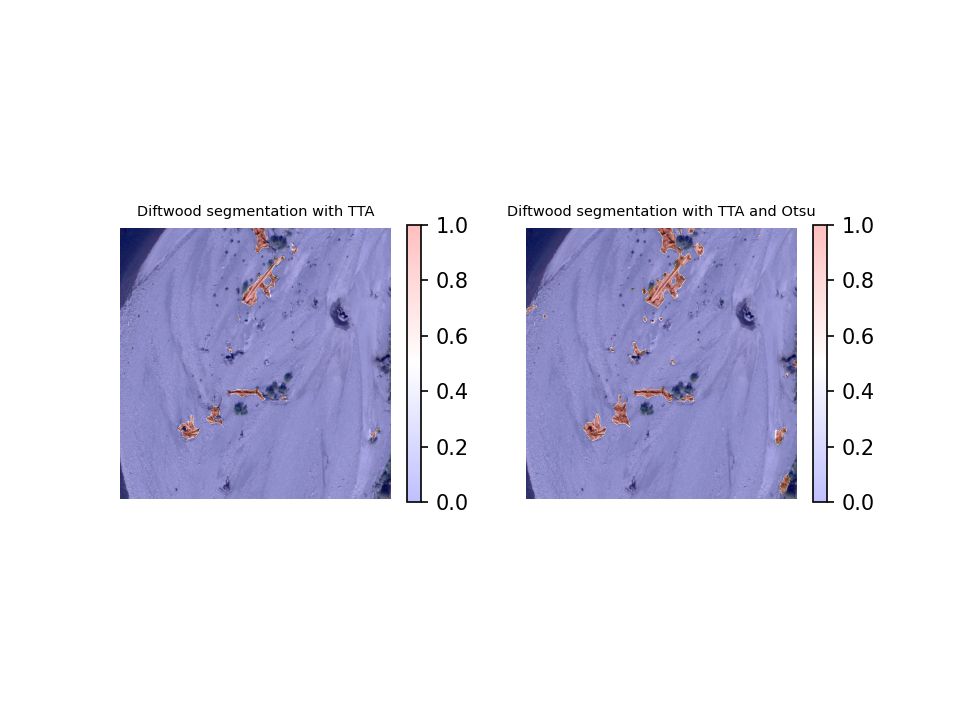

<IPython.core.display.Javascript object>


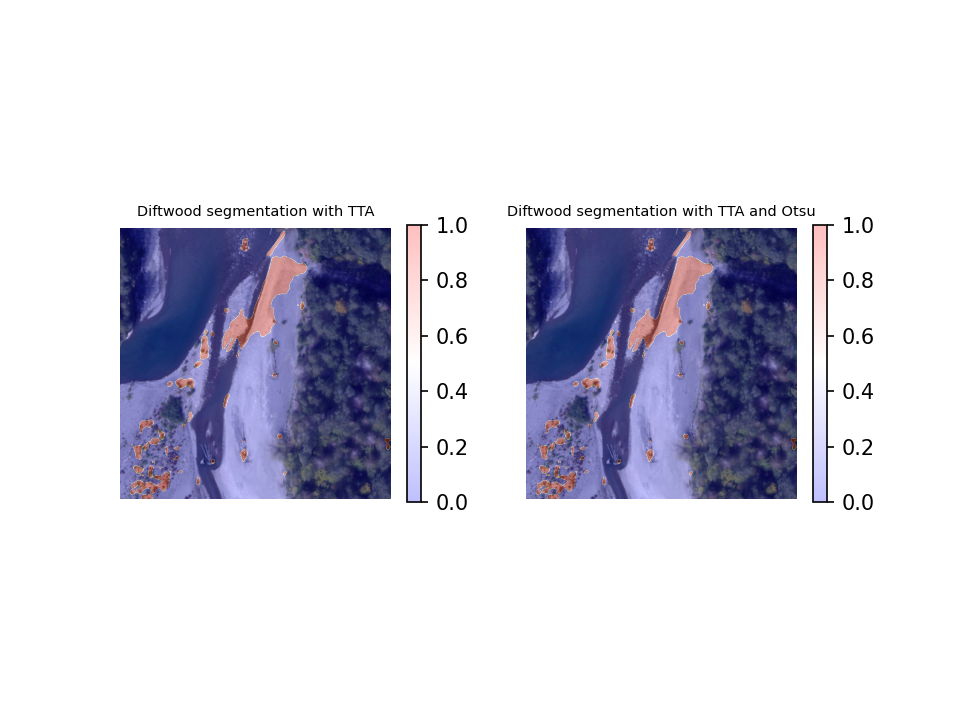

<IPython.core.display.Javascript object>


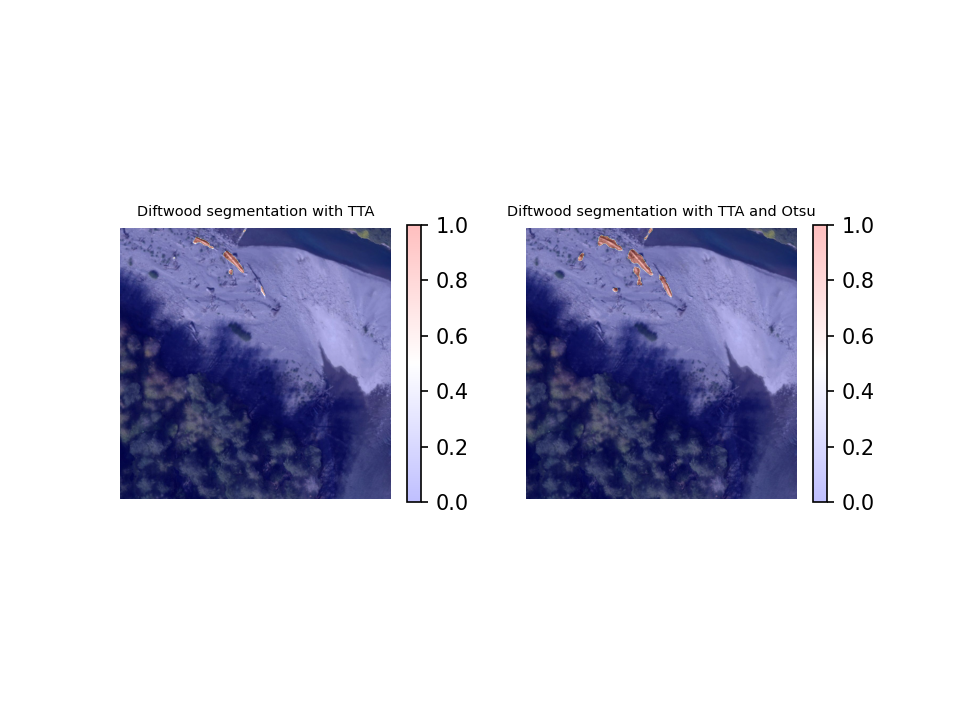

<IPython.core.display.Javascript object>


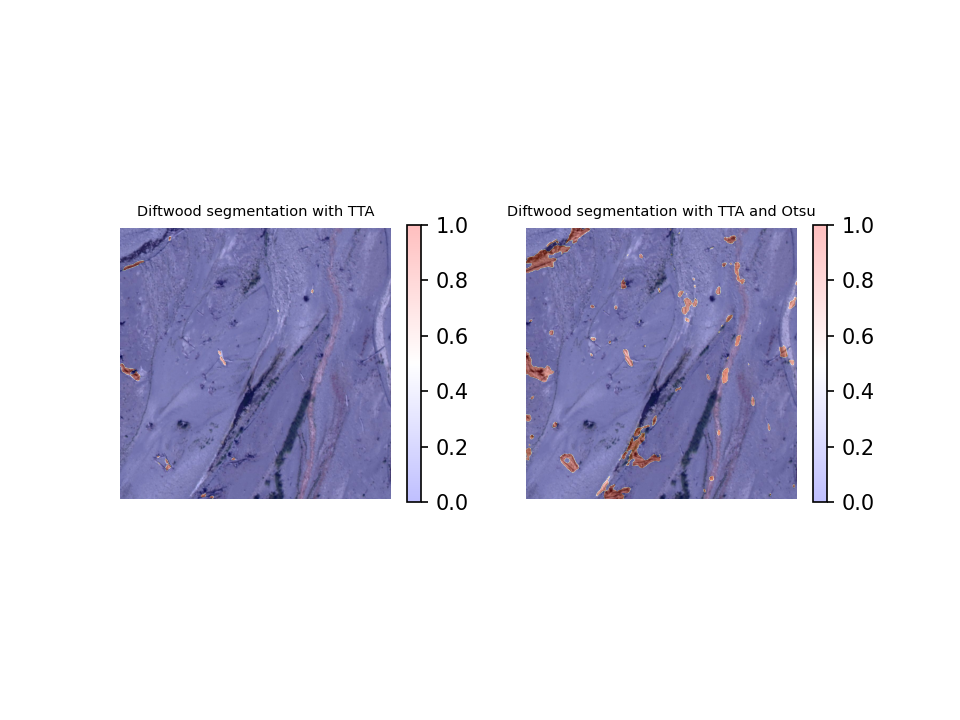

<IPython.core.display.Javascript object>


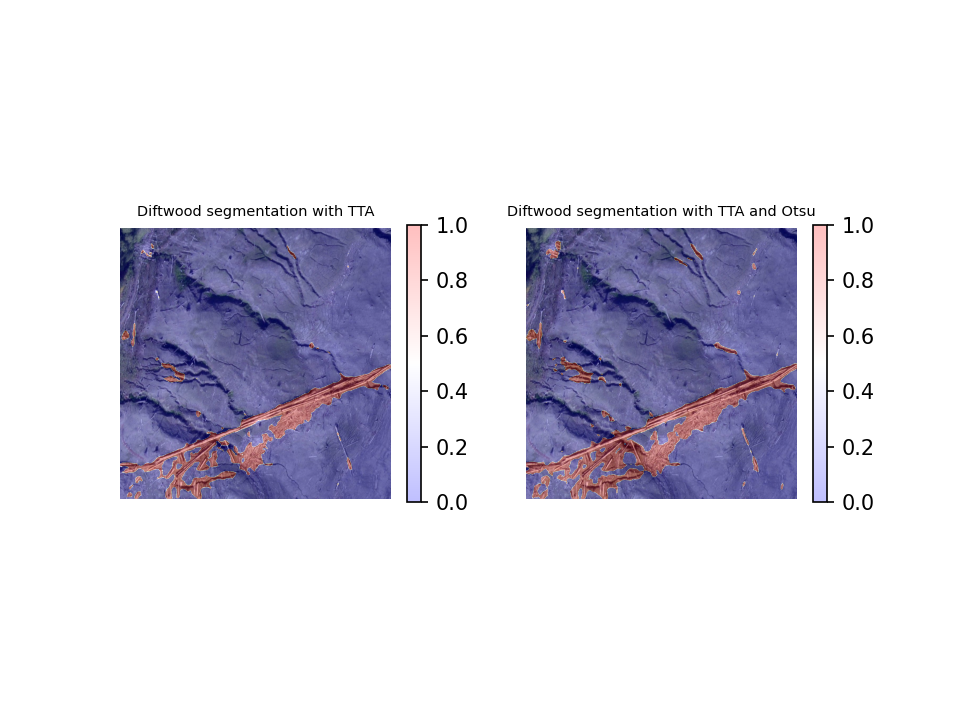

<IPython.core.display.Javascript object>


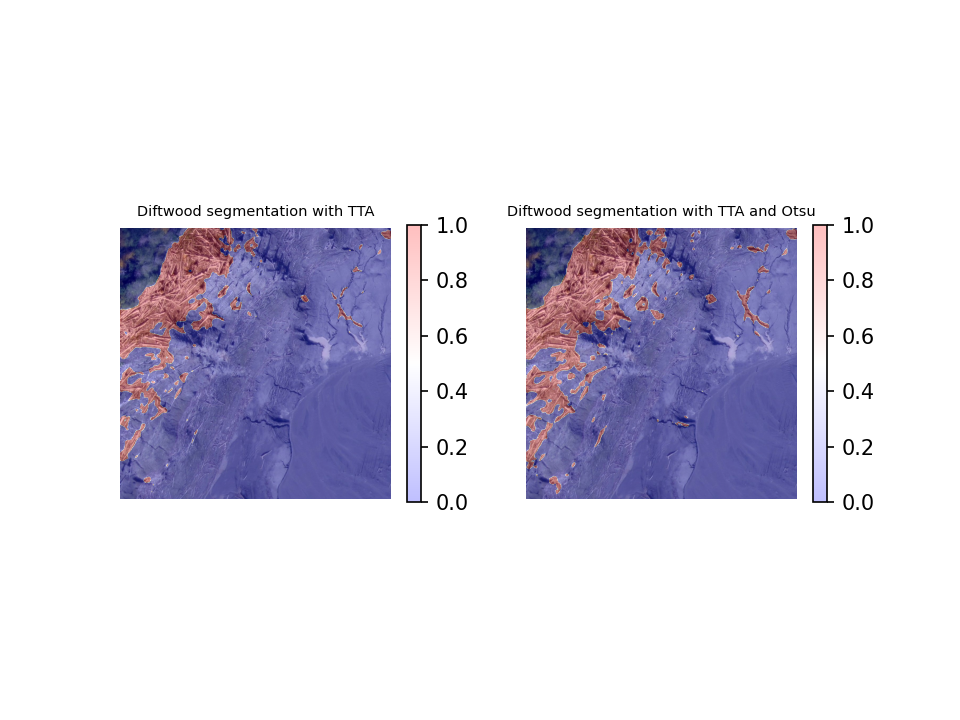

<IPython.core.display.Javascript object>


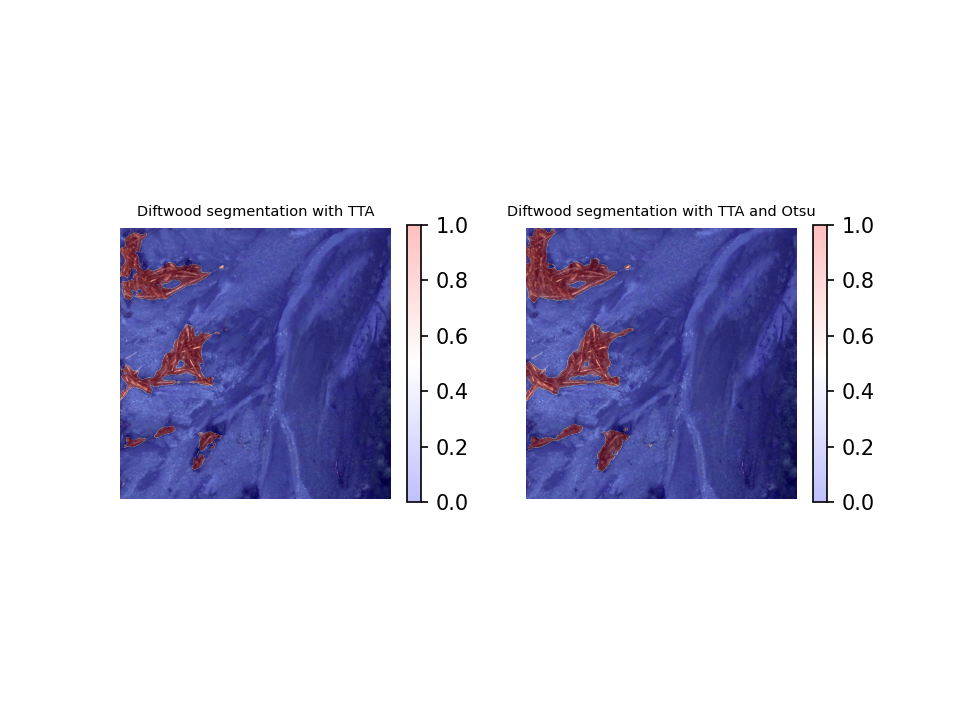

<IPython.core.display.Javascript object>


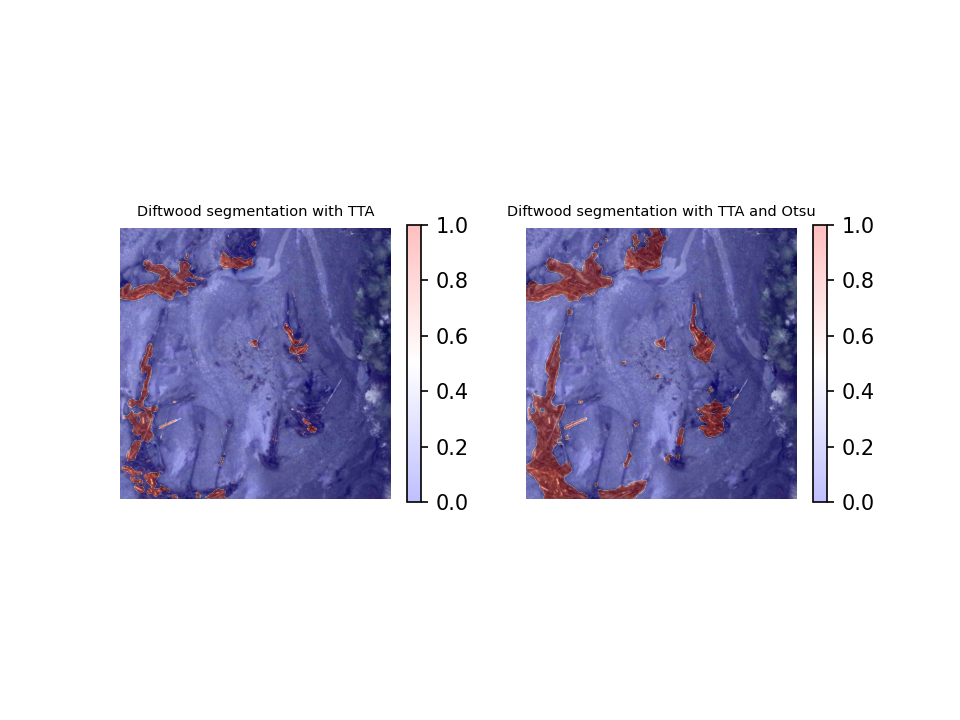

<IPython.core.display.Javascript object>


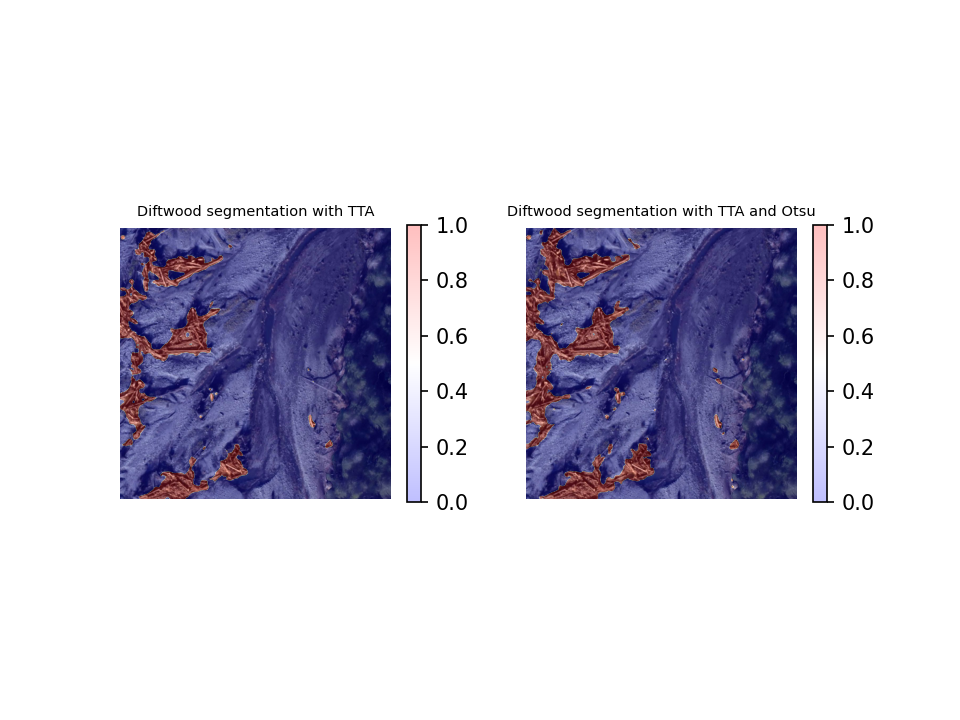

<IPython.core.display.Javascript object>


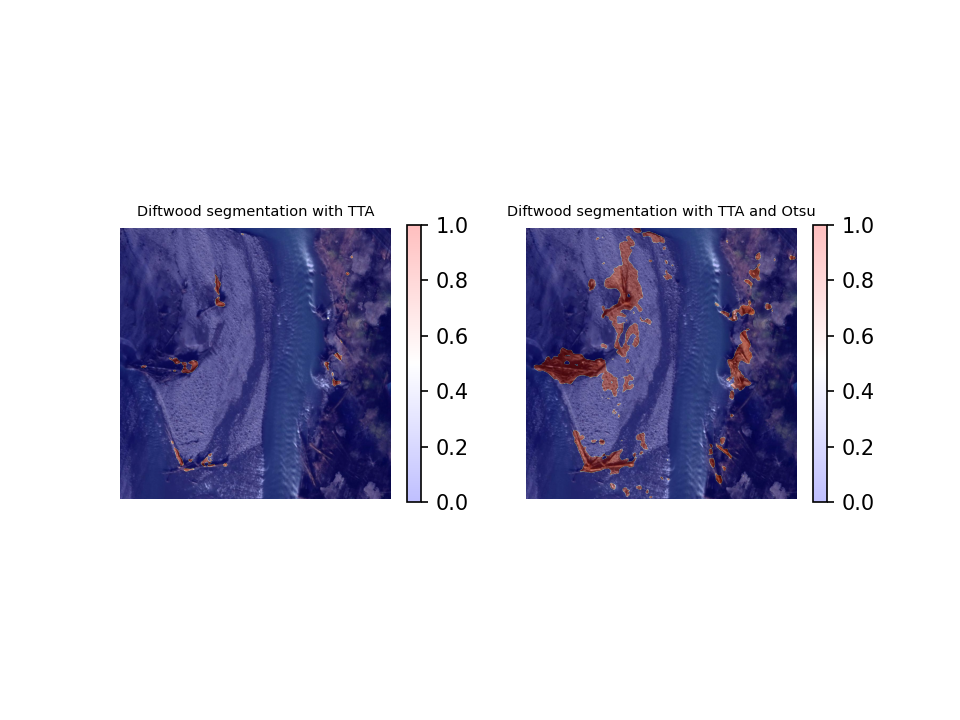

<IPython.core.display.Javascript object>


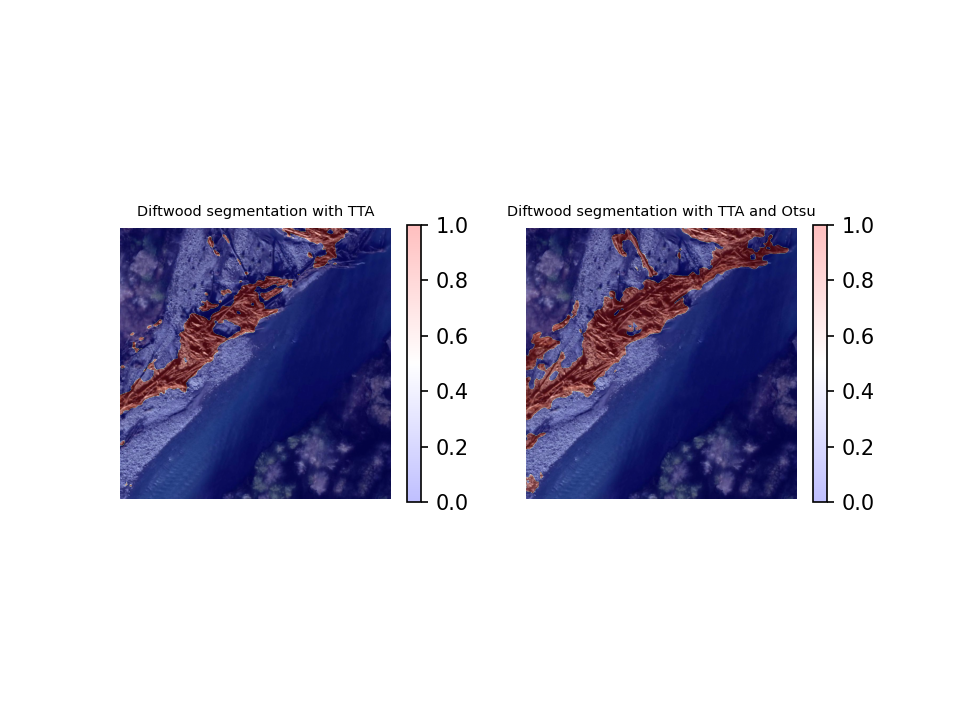

<IPython.core.display.Javascript object>


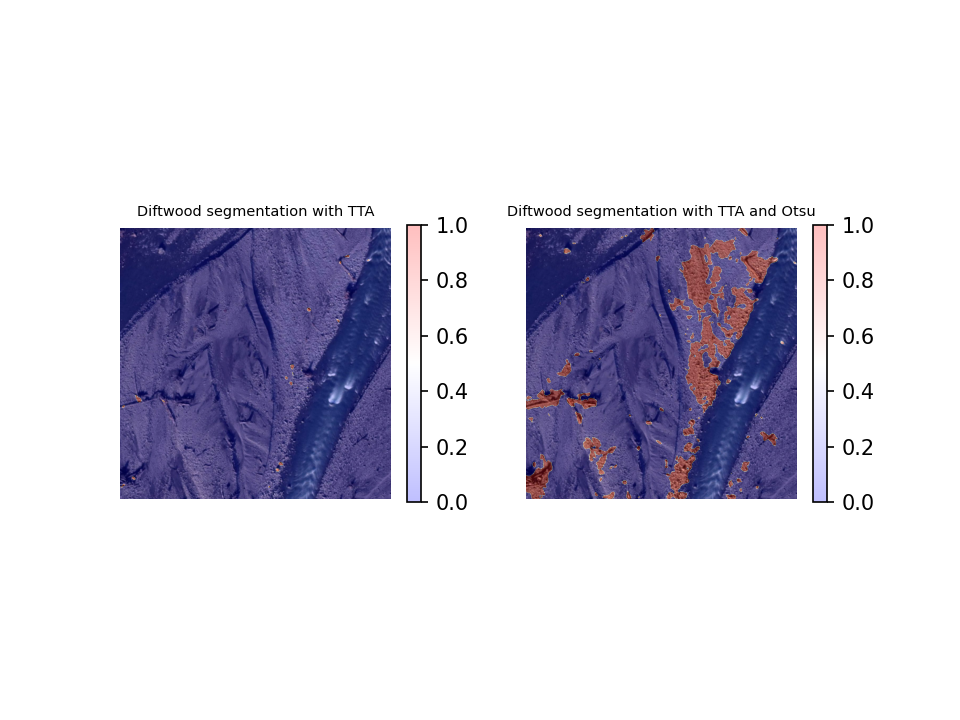

<IPython.core.display.Javascript object>


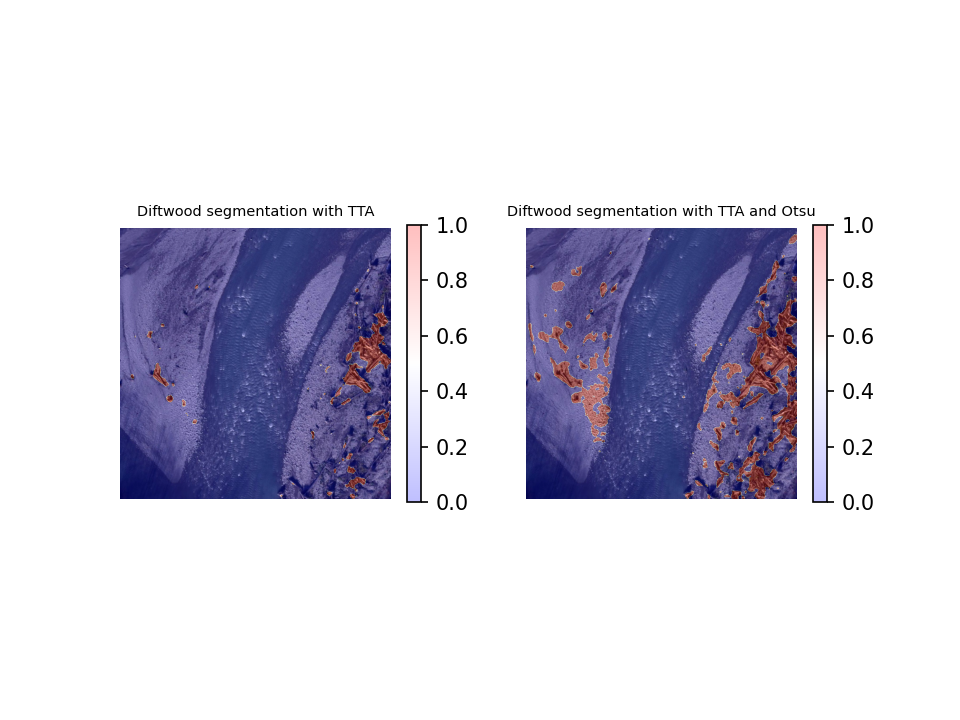

<IPython.core.display.Javascript object>


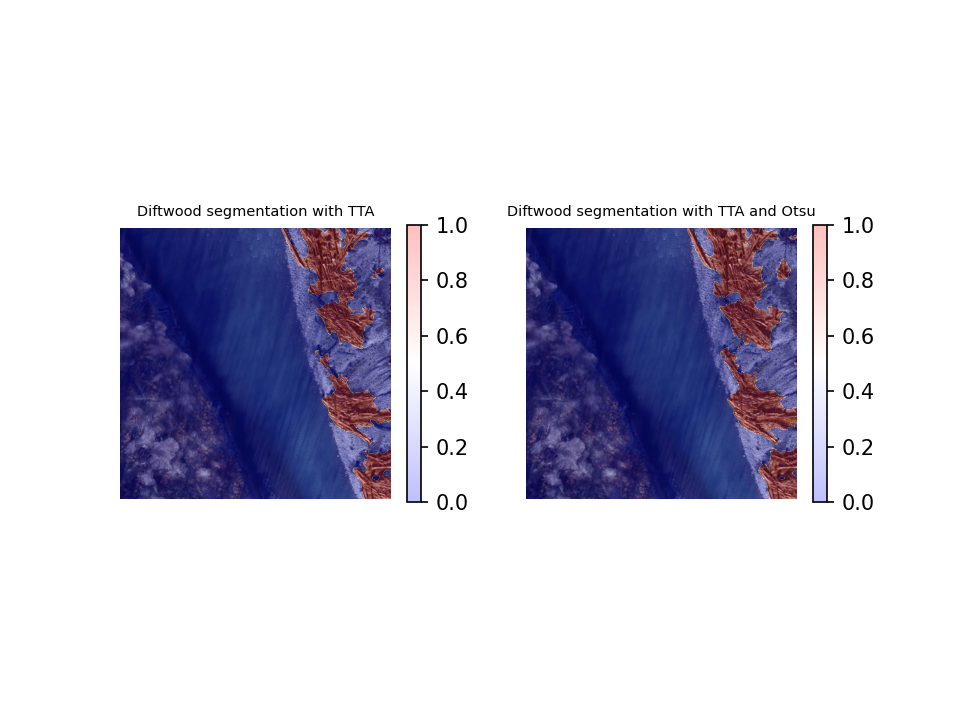

<IPython.core.display.Javascript object>


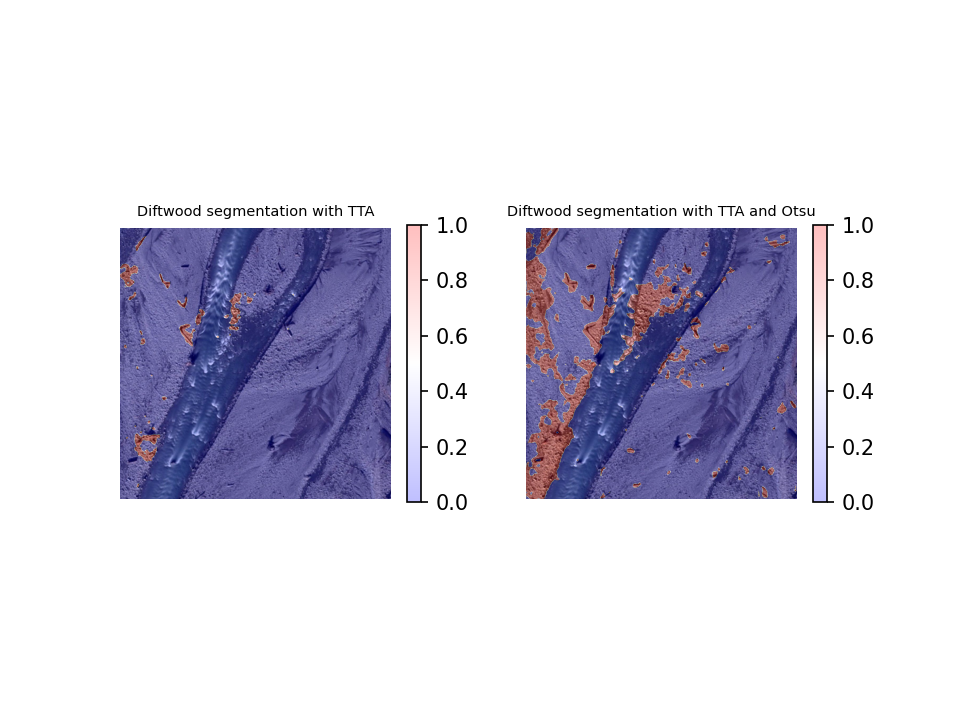

In [33]:
for img,result,resultOtsu in zip(I,R, RO):
    plt.subplot(121)
    plt.imshow(img/255.)
    plt.imshow(result,  cmap='bwr', alpha=0.25)
    plt.axis('off')
    plt.colorbar(shrink=0.5)
    plt.title('Diftwood segmentation with TTA', fontsize=7)
    
    plt.subplot(122)
    plt.imshow(img/255.)
    plt.imshow(resultOtsu,  cmap='bwr', alpha=0.25)
    plt.axis('off')
    plt.colorbar(shrink=0.5)
    plt.title('Diftwood segmentation with TTA and Otsu', fontsize=7)    
    plt.show()

Use your judgement to determine what is the best way to implement a model. You may not need TTA or Otsu thresholding, or perhaps you have your own ideas for how to best implement your model. This is just a guide